In [ ]:
# NR427 - Cam Caron

# Objective: This project demonstrates my ability to analyze weather data and create interactive visualizations using Python. 
# Iutilized 10 years of weather data for three different locations in Denver and developed an interactive map to showcase my learning outcomes and skills.

# Tools and Libraries Used:

# Pandas: For data processing and analysis
# Matplotlib: For data visualization
# Folium: For creating an interactive map
# NumPy: For numerical computations

# Methodology:

#  Data Collection and Cleaning:
# Collected 10 years of weather data from Denver International Airport, Denver Centennial Airport, and Denver Water Department.
#  Parsed the data into Pandas DataFrames.
# Added geographical coordinates (latitude and longitude) to each dataset.
#  Data Analysis and Visualization:
# Analyzed maximum and minimum temperatures to identify trends over the years.
# Visualized temperature trends using Matplotlib.
#  Interactive Map Creation:
# Used Folium to create an interactive map centered on Denver.
# Plotted markers for each location, displaying relevant weather information (maximum and minimum temperatures) upon clicking.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
import numpy as np


In [2]:
# Load the weather data into a DataFrame
weather_data = pd.read_csv(r'C:\Users\Allards Rigs #36\Documents\DENWEATH.csv')


In [3]:
# Display the first few rows of the DataFrame
print(weather_data.head())

# Get an overview of the DataFrame's structure
print(weather_data.info())

# Summarize the numerical columns
print(weather_data.describe())


       STATION                                 NAME      DATE  PRCP  SNOW  \
0  USW00003017  DENVER INTERNATIONAL AIRPORT, CO US  1/2/2014  0.00   0.0   
1  USW00003017  DENVER INTERNATIONAL AIRPORT, CO US  1/3/2014  0.00   0.0   
2  USW00003017  DENVER INTERNATIONAL AIRPORT, CO US  1/4/2014  0.21   3.2   
3  USW00003017  DENVER INTERNATIONAL AIRPORT, CO US  1/5/2014  0.05   0.6   
4  USW00003017  DENVER INTERNATIONAL AIRPORT, CO US  1/6/2014  0.00   0.0   

   TAVG  TMAX  TMIN  
0  23.0  42.0  11.0  
1  40.0  62.0  25.0  
2  31.0  38.0   6.0  
3  10.0  12.0 -10.0  
4   4.0  34.0  -8.0  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4401 entries, 0 to 4400
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   STATION  3653 non-null   object 
 1   NAME     3653 non-null   object 
 2   DATE     3653 non-null   object 
 3   PRCP     3653 non-null   float64
 4   SNOW     3653 non-null   float64
 5   TAVG     3563 non-null   flo

In [42]:
# Add latitude and longitude columns to weather_data DataFrame
weather_data['Latitude'] = 39.8617  # Latitude of Denver International Airport
weather_data['Longitude'] = -104.6731  # Longitude of Denver International Airport

In [5]:
# Check for missing values
print(weather_data.isnull().sum())

# Handle missing values by forward filling
weather_data.ffill(inplace=True)

# Convert date column to datetime format
weather_data['DATE'] = pd.to_datetime(weather_data['DATE'])


STATION    0
NAME       0
DATE       0
PRCP       0
SNOW       0
TAVG       0
TMAX       0
TMIN       0
dtype: int64


Temperature Trends over Time


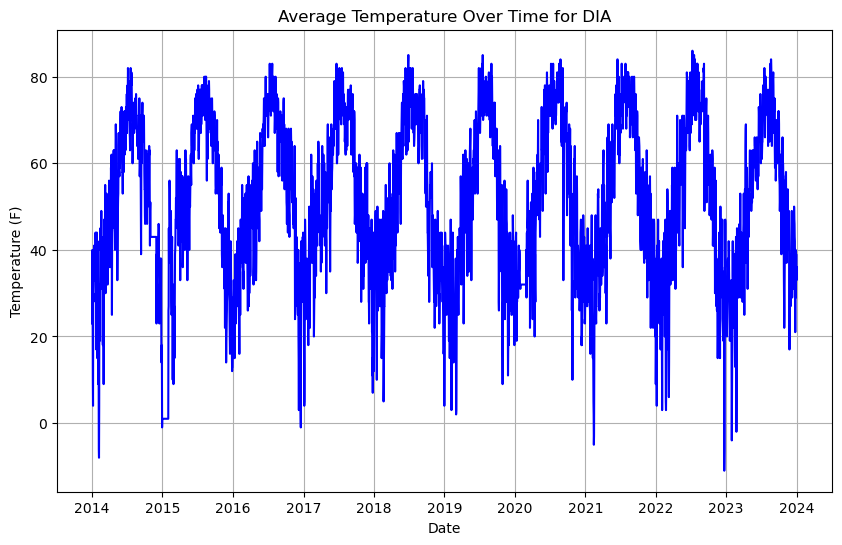

In [15]:
# Visualize trends in temperature over time
plt.figure(figsize=(10, 6))
plt.plot(weather_data['DATE'], weather_data['TAVG'], color='blue')
plt.title('Average Temperature Over Time for DIA')
plt.xlabel('Date')
plt.ylabel('Temperature (F)')
plt.grid(True)
plt.show()


In [52]:
print("Finding the Highest and Lowest Temperature for Each Year (DIA):")
print('\n')
# Extract year from the date column
weather_data['Year'] = weather_data['DATE'].dt.year

# Group by year and find the highest and lowest temperature
yearly_temps = weather_data.groupby('Year')['TAVG'].agg([('Highest Temp', 'max'), ('Lowest Temp', 'min')])
print(yearly_temps)

# Note - data set is from Feb to Feb so the 2024 temp will be off.


Finding the Highest and Lowest Temperature for Each Year (DIA):


      Highest Temp  Lowest Temp
Year                           
2014          82.0         -8.0
2015          80.0          1.0
2016          83.0         -1.0
2017          83.0          4.0
2018          85.0          5.0
2019          85.0          2.0
2020          84.0         10.0
2021          84.0         -5.0
2022          86.0        -11.0
2023          84.0         -4.0
2024          36.0         33.0


In [53]:
print("Finding the Months with the Most Snow per Year (DIA):")
print('\n')
# Extract month from the date column
weather_data['Month'] = weather_data['DATE'].dt.month

# Group by year and month, and find the month with the most snow
monthly_snow = weather_data.groupby(['Year', 'Month'])['SNOW'].sum().reset_index()
max_snow_per_year = monthly_snow.loc[monthly_snow.groupby('Year')['SNOW'].idxmax()]
print(max_snow_per_year)

# Note - data set is from Feb to Feb so the 2024 temp will be off.


Finding the Months with the Most Snow per Year (DIA):


     Year  Month  SNOW
0    2014      1  12.1
13   2015      2  22.4
26   2016      3  18.4
36   2017      1   6.3
48   2018      1   6.4
70   2019     11  13.7
73   2020      2  16.5
86   2021      3  34.0
97   2022      2  15.8
108  2023      1  13.0
120  2024      1   0.0


In [54]:
print("Seasonal Temp Analysis (DIA)")
print('\n')
# Define a function to classify months into seasons
def get_season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'
    else:
        return 'Winter'

# Apply the function to create a new column for season
weather_data['Season'] = weather_data['Month'].apply(get_season)

# Group by season and calculate the average temperature
seasonal_temps = weather_data.groupby('Season')['TAVG'].mean()
print(seasonal_temps)


Seasonal Temp Analysis (DIA)


Season
Fall      53.413187
Spring    48.389130
Summer    72.366304
Winter    33.115082
Name: TAVG, dtype: float64


In [55]:
print("Extreme Weather Events (DIA)")
print('\n')
# Define thresholds for extreme conditions 
heatwave_threshold = 90  # Fahrenheit
cold_spell_threshold = 32  # Fahrenheit
heavy_rainfall_threshold = 1  # Inch
snowstorm_threshold = 6  # Inches

# Identify extreme weather events exceeding thresholds
heatwaves = weather_data[weather_data['TMAX'] > heatwave_threshold]
cold_spells = weather_data[weather_data['TMIN'] < cold_spell_threshold]
heavy_rainfall = weather_data[weather_data['PRCP'] > heavy_rainfall_threshold]
snowstorms = weather_data[weather_data['SNOW'] > snowstorm_threshold]

# Calculate the frequency and duration of extreme events
heatwave_frequency = len(heatwaves) / 365  
cold_spell_frequency = len(cold_spells) / 365
heavy_rainfall_frequency = len(heavy_rainfall) / 365
snowstorm_frequency = len(snowstorms) / 365

# Calculate the duration of extreme events 

# Example for heatwaves
heatwave_duration = heatwaves.groupby((heatwaves['DATE'] - heatwaves['DATE'].shift()).dt.days.ne(1).cumsum()).size().mean()
print("Heatwave frequency:", heatwave_frequency)
print("Heatwave average duration (days):", heatwave_duration)
print('\n')

# cold spells
cold_spell_duration = cold_spells.groupby((cold_spells['DATE'] - cold_spells['DATE'].shift()).dt.days.ne(1).cumsum()).size().mean()
print("Cold Spell frequency:", cold_spell_frequency)
print("Heatwave average duration (days):", cold_spell_duration)
print('\n')

# heavy rainfall
heavy_rainfall_duration = heavy_rainfall.groupby((heavy_rainfall['DATE'] - heavy_rainfall['DATE'].shift()).dt.days.ne(1).cumsum()).size().mean()
print("Cold Spell frequency:", heavy_rainfall_frequency)
print("Heatwave average duration (days):", heavy_rainfall_duration)



Extreme Weather Events (DIA)


Heatwave frequency: 1.263013698630137
Heatwave average duration (days): 2.9177215189873418


Cold Spell frequency: 5.958904109589041
Heatwave average duration (days): 2.2585669781931466


Cold Spell frequency: 0.043835616438356165
Heatwave average duration (days): 1.0666666666666667


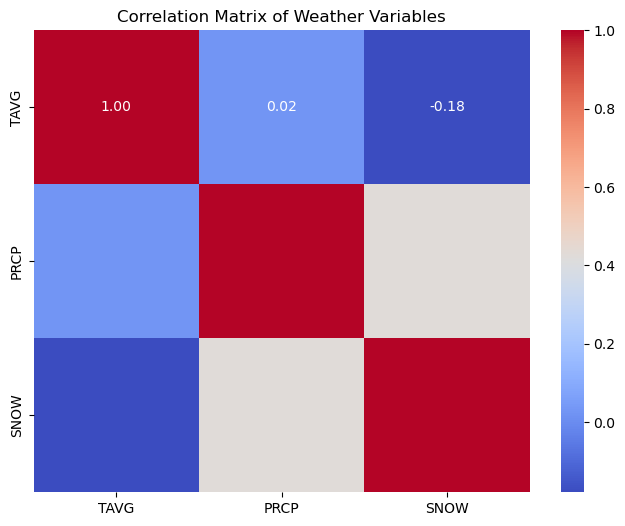

In [23]:
# Calculate correlation coefficients between weather variables
correlation_matrix = weather_data[['TAVG', 'PRCP', 'SNOW']].corr()

# Visualize correlation matrix as a heatmap
import seaborn as sns
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Weather Variables')
plt.show()


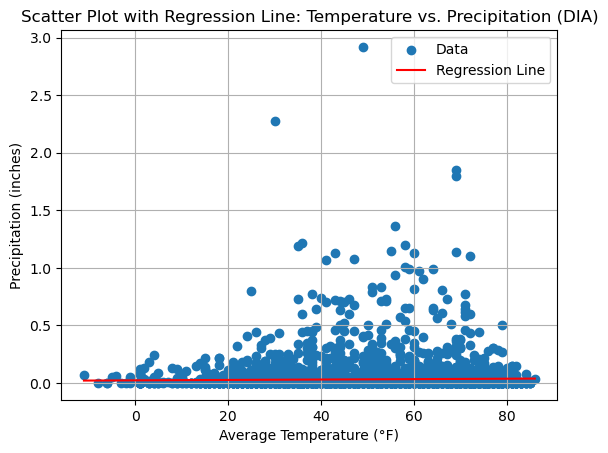

In [56]:
# Extract temperature and precipitation data from the DataFrame
temperature = weather_data['TAVG']
precipitation = weather_data['PRCP']

# Plot scatter plot
plt.scatter(temperature, precipitation, label='Data')

# Calculate regression line
coefficients = np.polyfit(temperature, precipitation, 1)
polynomial = np.poly1d(coefficients)
x_values = np.linspace(min(temperature), max(temperature), 100)
y_values = polynomial(x_values)

# Plot regression line
plt.plot(x_values, y_values, color='red', label='Regression Line')

# Add labels and title
plt.xlabel('Average Temperature (°F)')
plt.ylabel('Precipitation (inches)')
plt.title('Scatter Plot with Regression Line: Temperature vs. Precipitation (DIA)')

# Add legend
plt.legend()

# Show plot
plt.grid(True)
plt.show()

In [38]:
new_weather_data = pd.read_csv(r'C:\Users\Allards Rigs #36\Documents\CEN-WATER.csv')

In [47]:
# Add latitude and longitude columns for Centennial Airport to new_weather_data DataFrame
new_weather_data.loc[new_weather_data['NAME'] == 'DENVER CENTENNIAL AIRPORT, CO US', 'Latitude'] = 39.5771
new_weather_data.loc[new_weather_data['NAME'] == 'DENVER CENTENNIAL AIRPORT, CO US', 'Longitude'] = -104.7847

# Add latitude and longitude columns for Denver Water Dept. to new_weather_data DataFrame
new_weather_data.loc[new_weather_data['NAME'] == 'DENVER WATER DEPARTMENT, CO US', 'Latitude'] = 39.7350
new_weather_data.loc[new_weather_data['NAME'] == 'DENVER WATER DEPARTMENT, CO US', 'Longitude'] = -105.0098



In [48]:
print(new_weather_data.columns)


Index(['STATION', 'NAME', 'DATE', 'PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN',
       'Latitude', 'Longitude'],
      dtype='object')


In [51]:
# Initialize a Folium map centered on Denver
m = folium.Map(location=[39.7392, -104.9903], zoom_start=10)

# Create feature groups for each airport
fg_dia = folium.FeatureGroup(name='Denver International Airport')
fg_centennial = folium.FeatureGroup(name='Centennial Airport')
fg_water = folium.FeatureGroup(name='Denver Water Department')

# Function to add markers with TMAX, TMIN data
def add_markers(data, feature_group):
    for _, row in data.iterrows():
        tmax = row.get('TMAX', 'N/A')
        tmin = row.get('TMIN', 'N/A')
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=f"{row['NAME']}\nTMAX: {tmax}\nTMIN: {tmin}",
            tooltip=row['NAME']
        ).add_to(feature_group)

# Add markers to feature groups
add_markers(weather_data, fg_dia)
add_markers(new_weather_data[new_weather_data['NAME'] == 'DENVER CENTENNIAL AIRPORT, CO US'], fg_centennial)
add_markers(new_weather_data[new_weather_data['NAME'] == 'DENVER WATER DEPARTMENT, CO US'], fg_water)

# Add feature groups to the map
fg_dia.add_to(m)
fg_centennial.add_to(m)
fg_water.add_to(m)

# Add layer control to toggle between feature groups
folium.LayerControl().add_to(m)

# Display the map
m